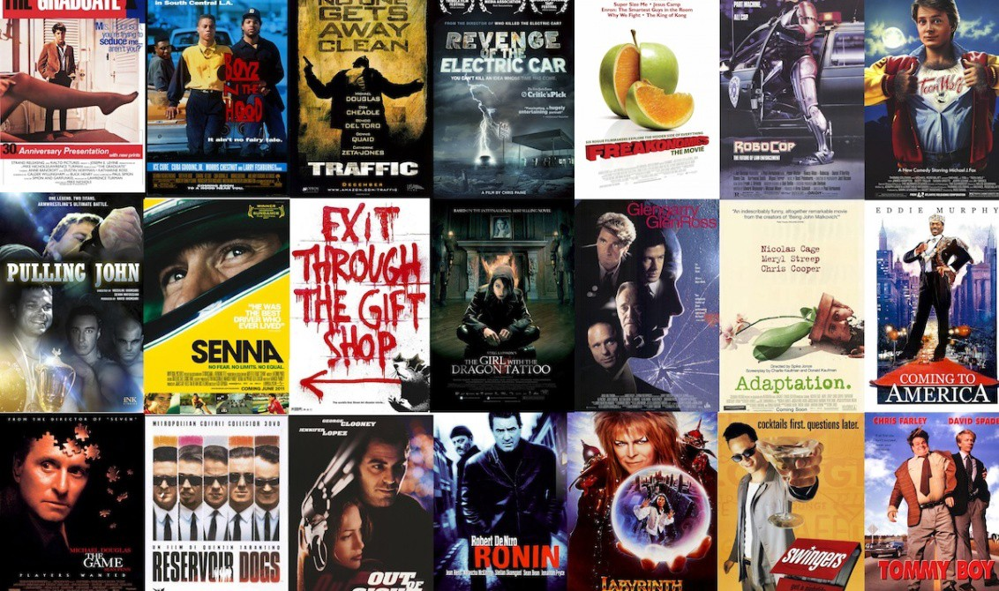

In this Predict we will build a recommendation model by using the Surprise method
Surprise is a Python scikit for building and analyzing recommender systems that deal with explicit rating data.

**Surprise was designed with the following purposes in mind:**

+ Give users perfect control over their experiments
+ Provide various ready-to-use prediction algorithms such as baseline algorithms, neighborhood methods
+ Make it easy to implement new algorithm ideas.
+ Provide tools to evaluate, analyze and compare the algorithms’ performance. Cross-validation procedures can be run very easily using powerful CV iterators (inspired by sci-kit-learn excellent tools.

In [1]:
!pip install LibRecommender
!pip install surprise
!pip install comet_ml
!pip install seaborn
!pip install wordcloud


  Running setup.py clean for LibRecommender
  Created wheel for termcolor: filename=termcolor-1.1.0-py3-none-any.whl size=4829 sha256=7b0524d0508397fa1057e15b37ef088dac54177b2c081d2f62e165f7df2c20c0
  Stored in directory: c:\users\bohlale\appdata\local\pip\cache\wheels\a0\16\9c\5473df82468f958445479c59e784896fa24f4a5fc024b0f501
Successfully built termcolor
Failed to build LibRecommender
  Attempting uninstall: importlib-metadata
    Found existing installation: importlib-metadata 3.10.0
    Uninstalling importlib-metadata-3.10.0:
      Successfully uninstalled importlib-metadata-3.10.0
    Running setup.py install for LibRecommender: started
    Running setup.py install for LibRecommender: finished with status 'error'


  ERROR: Command errored out with exit status 1:
   command: 'C:\Users\Bohlale\anaconda3\python.exe' -u -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\Bohlale\\AppData\\Local\\Temp\\pip-install-0ng1bssy\\librecommender_d9178fb218a44a4b8e6b28463e28edf5\\setup.py'"'"'; __file__='"'"'C:\\Users\\Bohlale\\AppData\\Local\\Temp\\pip-install-0ng1bssy\\librecommender_d9178fb218a44a4b8e6b28463e28edf5\\setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d 'C:\Users\Bohlale\AppData\Local\Temp\pip-wheel-28j08x5d'
       cwd: C:\Users\Bohlale\AppData\Local\Temp\pip-install-0ng1bssy\librecommender_d9178fb218a44a4b8e6b28463e28edf5\
  Complete output (96 lines):
  running bdist_wheel
  running build
  running build_py
  creating build
  creating build\lib.win-amd64-3.8
  creating build\lib.win-amd64-3.8\libreco
  copying libreco\__init__.py -> buil

    error: Microsoft Visual C++ 14.0 or greater is required. Get it with "Microsoft C++ Build Tools": https://visualstudio.microsoft.com/visual-cpp-build-tools/
    ----------------------------------------
ERROR: Command errored out with exit status 1: 'C:\Users\Bohlale\anaconda3\python.exe' -u -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\Bohlale\\AppData\\Local\\Temp\\pip-install-0ng1bssy\\librecommender_d9178fb218a44a4b8e6b28463e28edf5\\setup.py'"'"'; __file__='"'"'C:\\Users\\Bohlale\\AppData\\Local\\Temp\\pip-install-0ng1bssy\\librecommender_d9178fb218a44a4b8e6b28463e28edf5\\setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' install --record 'C:\Users\Bohlale\AppData\Local\Temp\pip-record-4o1twf56\install-record.txt' --single-version-externally-managed --compile --install-headers 'C:\Users\Bohlale\anaconda3\Include\LibRecommender' Check t

In [2]:
!pip install plotly

In [3]:
!pip install cufflinks

In [4]:
import warnings
warnings.simplefilter(action='ignore')

import pandas as pd
import numpy as np
import re

# visualisation libraries
from plotly.offline import init_notebook_mode, plot, iplot
import plotly.graph_objs as go
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import seaborn as sns
import matplotlib


# Data Preprocessing
import cufflinks as cf
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from sklearn.model_selection import train_test_split

# Modelling
from surprise import Reader, Dataset
from surprise import SVD, SVDpp, NormalPredictor, BaselineOnly, NMF, SlopeOne, CoClustering, KNNWithMeans
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

# Performance Evaluation
from surprise import accuracy
from sklearn.metrics import mean_squared_error
from surprise.model_selection import GridSearchCV, cross_validate, train_test_split

#extra 
from itertools import permutations
import heapq
import pickle

In [5]:

g_scores_df = pd.read_csv('genome_scores.csv')
g_tags_df = pd.read_csv('genome_tags.csv')
imdb_df = pd.read_csv('imdb_data.csv')
links_df = pd.read_csv('links.csv')
movies_df = pd.read_csv('movies.csv')
tags_df = pd.read_csv('tags.csv')
test_df = pd.read_csv('test.csv')
train_df = pd.read_csv('train.csv')


#We won't be making use of all the data available to us, 
#we'll import values that we find interesting

movies = movies_df
imdb_data = imdb_df
tags = tags_df
train = train_df
test = test_df

In [6]:
pd.set_option("display.max_rows", None, "display.max_columns", None)

In [7]:
#check the shape of the data
shape = {'Genome scores': g_scores_df.shape,
            'Genome tags': g_tags_df.shape,
            'IMDB': imdb_df.shape,
            'Links': links_df.shape,
            "Movies": movies_df.shape,
            'Tags': tags_df.shape,
            'Train': train_df.shape,
            'Test': test_df.shape}

df_shape = pd.DataFrame(list(shape.items()), columns=['Data Frame', 'Shape'])
df_shape

,Data Frame,Shape
0,Genome scores,"(15584448, 3)"
1,Genome tags,"(1128, 2)"
2,IMDB,"(27278, 6)"
3,Links,"(62423, 3)"
4,Movies,"(62423, 3)"
5,Tags,"(1093360, 4)"
6,Train,"(10000038, 4)"
7,Test,"(5000019, 2)"


In [8]:
#show full value of dataframe
pd.set_option("display.max_rows", None, "display.max_columns", None)

# Display the first 5 entries in each dataframe 
display(movies_df.head())
display(imdb_df.head())
display(tags_df.head())
display(train_df.head())

# Count the number of unique entries for features of interest
unique_movies = len(movies_df['movieId'].unique().tolist())
unique_tags = len(tags_df['tag'].unique().tolist())
unique_users = len(train_df['userId'].unique().tolist())
unique_directors = len(imdb_df['director'].unique().tolist())
unique_actors = len(imdb_df['title_cast'].unique().tolist())

# Create a dataframe to store the number of unique entries for features of interest
unique = pd.DataFrame({"movies": [unique_movies],
                       "tags" : [unique_tags],
                       "users": [unique_users],
                       "directors" : [unique_directors],
                       "actors" : [unique_actors]}, index=['unique_entries'])

print('number of unique entries for features of interest')
display(unique.transpose())

# Determine and display the min and max ratings received
min_rating = train_df.rating.min()
max_rating = train_df.rating.max()
print('Lowest rating: {}'.format(min_rating))
print('Highest rating: {}'.format(max_rating))

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


,movieId,title_cast,director,runtime,budget,plot_keywords
0,1,Tom Hanks|Tim Allen|Don Rickles|Jim Varney|Wal...,John Lasseter,81.0,"$30,000,000",toy|rivalry|cowboy|cgi animation
1,2,Robin Williams|Jonathan Hyde|Kirsten Dunst|Bra...,Jonathan Hensleigh,104.0,"$65,000,000",board game|adventurer|fight|game
2,3,Walter Matthau|Jack Lemmon|Sophia Loren|Ann-Ma...,Mark Steven Johnson,101.0,"$25,000,000",boat|lake|neighbor|rivalry
3,4,Whitney Houston|Angela Bassett|Loretta Devine|...,Terry McMillan,124.0,"$16,000,000",black american|husband wife relationship|betra...
4,5,Steve Martin|Diane Keaton|Martin Short|Kimberl...,Albert Hackett,106.0,"$30,000,000",fatherhood|doberman|dog|mansion


,userId,movieId,tag,timestamp
0,3,260,classic,1439472355
1,3,260,sci-fi,1439472256
2,4,1732,dark comedy,1573943598
3,4,1732,great dialogue,1573943604
4,4,7569,so bad it's good,1573943455


,userId,movieId,rating,timestamp
0,5163,57669,4.0,1518349992
1,106343,5,4.5,1206238739
2,146790,5459,5.0,1076215539
3,106362,32296,2.0,1423042565
4,9041,366,3.0,833375837


number of unique entries for features of interest


,unique_entries
movies,62423
tags,73051
users,162541
directors,11787
actors,17144


Lowest rating: 0.5
Highest rating: 5.0


In [9]:
# We create a dataframe that merges all the features that we think might help us in solving the problem
df = imdb_data[['movieId','title_cast','director', 'plot_keywords']]
df = df.merge(movies[['movieId', 'genres', 'title']], on='movieId', how='inner')
#Add colummn for release year
df['year'] = df['title'].str.extract(r"\((\d+)\)", expand=False)
df.head()

,movieId,title_cast,director,plot_keywords,genres,title,year
0,1,Tom Hanks|Tim Allen|Don Rickles|Jim Varney|Wal...,John Lasseter,toy|rivalry|cowboy|cgi animation,Adventure|Animation|Children|Comedy|Fantasy,Toy Story (1995),1995
1,2,Robin Williams|Jonathan Hyde|Kirsten Dunst|Bra...,Jonathan Hensleigh,board game|adventurer|fight|game,Adventure|Children|Fantasy,Jumanji (1995),1995
2,3,Walter Matthau|Jack Lemmon|Sophia Loren|Ann-Ma...,Mark Steven Johnson,boat|lake|neighbor|rivalry,Comedy|Romance,Grumpier Old Men (1995),1995
3,4,Whitney Houston|Angela Bassett|Loretta Devine|...,Terry McMillan,black american|husband wife relationship|betra...,Comedy|Drama|Romance,Waiting to Exhale (1995),1995
4,5,Steve Martin|Diane Keaton|Martin Short|Kimberl...,Albert Hackett,fatherhood|doberman|dog|mansion,Comedy,Father of the Bride Part II (1995),1995


In [10]:
# Merge train with movies to join movie titles and ratings 
ratings = train_df.merge(movies_df, on='movieId', how='inner')

In [11]:
# Convert data types to strings for string handling
df['title_cast'] = df.title_cast.astype(str)
df['plot_keywords'] = df.plot_keywords.astype(str)
df['genres'] = df.genres.astype(str)
df['director'] = df.director.astype(str)

# Removing spaces between names
df['director'] = df['director'].apply(lambda x: "".join(x.lower() for x in x.split()))
df['title_cast'] = df['title_cast'].apply(lambda x: "".join(x.lower() for x in x.split()))

# Discarding the pipes between the actors' full names and getting only the first three names
df['title_cast'] = df['title_cast'].map(lambda x: x.split('|')[:3])

# Discarding the pipes between the plot keywords' and getting only the first five words
df['plot_keywords'] = df['plot_keywords'].map(lambda x: x.split('|')[:5])
df['plot_keywords'] = df['plot_keywords'].apply(lambda x: " ".join(x))

# Discarding the pipes between the genres 
df['genres'] = df['genres'].map(lambda x: x.lower().split('|'))
df['genres'] = df['genres'].apply(lambda x: " ".join(x))

df.head()

,movieId,title_cast,director,plot_keywords,genres,title,year
0,1,"[tomhanks, timallen, donrickles]",johnlasseter,toy rivalry cowboy cgi animation,adventure animation children comedy fantasy,Toy Story (1995),1995
1,2,"[robinwilliams, jonathanhyde, kirstendunst]",jonathanhensleigh,board game adventurer fight game,adventure children fantasy,Jumanji (1995),1995
2,3,"[waltermatthau, jacklemmon, sophialoren]",markstevenjohnson,boat lake neighbor rivalry,comedy romance,Grumpier Old Men (1995),1995
3,4,"[whitneyhouston, angelabassett, lorettadevine]",terrymcmillan,black american husband wife relationship betra...,comedy drama romance,Waiting to Exhale (1995),1995
4,5,"[stevemartin, dianekeaton, martinshort]",alberthackett,fatherhood doberman dog mansion,comedy,Father of the Bride Part II (1995),1995


In [12]:
# Total Number of ratings by the top 10 Users
tot_rating = train_df['userId'].value_counts().head(10).sum()
tot_movies = train_df["movieId"].nunique()
print("These Top 10 Users have provided a total of " + str(tot_rating) + " ratings together for " + str(tot_movies) + " movies")

These Top 10 Users have provided a total of 38970 ratings together for 48213 movies


In [13]:
# Extract and display the 10 most popular films in the dataset 
# Determine the average rating and number of ratings for each movie
ratings_mean_count = pd.DataFrame(ratings.groupby(['title'])[['rating']].mean())
ratings_mean_count['rating_counts'] = pd.DataFrame(ratings.groupby(['title'])['rating'].count())
ratings_mean_count['popularity'] = pd.DataFrame(ratings.groupby(['title'])['rating'].count()*ratings.groupby(['title'])['rating'].mean())

ratings_mean_count = ratings_mean_count.sort_values(by='popularity', ascending=False).head(10)
ratings_mean_count.head(10)

,rating,rating_counts,popularity
title,,,
"Shawshank Redemption, The (1994)",4.417624,32831,145035.0
Pulp Fiction (1994),4.195097,31697,132972.0
Forrest Gump (1994),4.047216,32383,131061.0
"Silence of the Lambs, The (1991)",4.144172,29444,122021.0
"Matrix, The (1999)",4.154253,29014,120531.5
Star Wars: Episode IV - A New Hope (1977),4.111811,27560,113321.5
Schindler's List (1993),4.247625,24004,101960.0
Fight Club (1999),4.227906,23536,99508.0
Star Wars: Episode V - The Empire Strikes Back (1980),4.146236,22956,95181.0


In [14]:
# Count how many ratings are in each category (1 star, 2 star, ect)
grouped = pd.DataFrame(ratings.groupby(['rating'])['title'].count())
grouped.rename(columns={'title':'rating_count'}, inplace=True)


In [42]:
##data_preprocessor(df, ['genres', 'title_cast', 'plot_keywords'])

In [20]:
# Creating an empty column and list to store the corpus for each movie
#df['Year'] = df['Year'].astype(str)
df['corpus'] = ''
corpus = []

# List of the columns we want to use to create our corpus 
columns = ['plot_keywords', 'genres', 'year']

# For each movie, combine the contents of the selected columns to form it's unique corpus 
for i in range(0, len(df['movieId'])):
    words = ''
    for col in columns:
        words = words + str(df.iloc[i][col]) + " "        
    corpus.append(words)

# Add the corpus information for each movie to the dataframe 
df['corpus'] = corpus
df.set_index('movieId', inplace=True)

# Drop the columns we don't need anymore to preserve memory
df.drop(columns=['title_cast', 'director', 'plot_keywords', 'genres', 'year'], inplace=True)


df.head(10)

,title,corpus
movieId,,
1,Toy Story (1995),toyrivalrycowboycgianimation adventureanimatio...
2,Jumanji (1995),boardgameadventurerfightgame adventurechildren...
3,Grumpier Old Men (1995),boatlakeneighborrivalry comedyromance 1995
4,Waiting to Exhale (1995),blackamericanhusbandwiferelationshipbetrayalmo...
5,Father of the Bride Part II (1995),fatherhooddobermandogmansion comedy 1995
6,Heat (1995),gunbattleorganizedcrimehonorcriminalinvestigat...
7,Sabrina (1995),characternameastitlechauffeurestateplayboy com...
8,Tom and Huck (1995),rescuefromdrowningneardrowningcharacternamesas...
9,Sudden Death (1995),hockeydeathintitletwowordtitleterrorist action...


# 2. Modeling

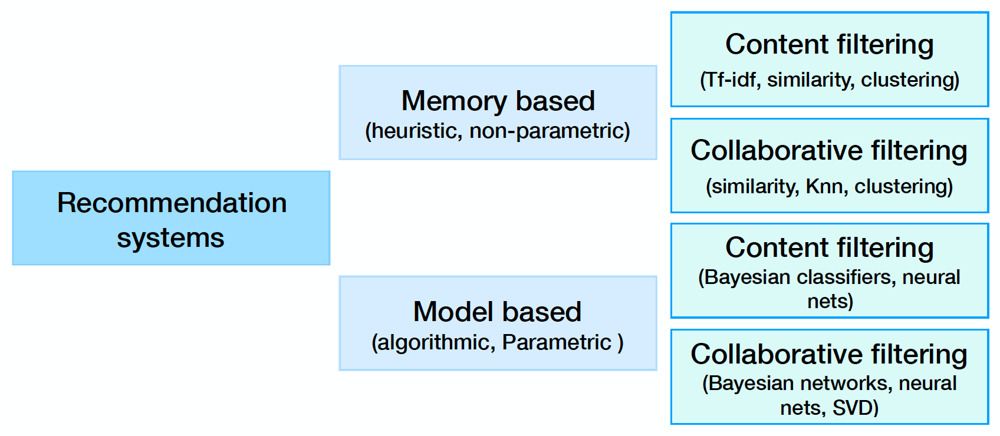
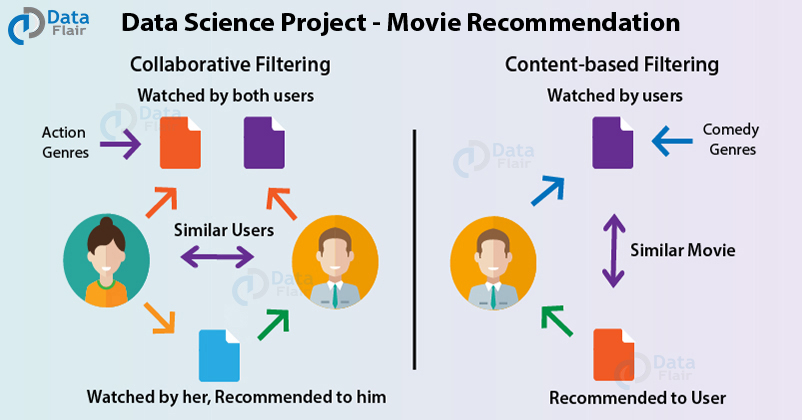

There are two most popular ways to approach recommender systems, those are collaborative filtering and content-based recommendations. In this predict, we will focus on the collaborative filtering approach, that is: the user is recommended items that people with similar tastes and preferences liked in the past. In another words, this method predicts unknown ratings by using the similarities between users.

## 2.1 Content-based

This system recommends items based on similarities. it looks at the properties of an item and tries to look at different items that have similar properties and recommends them to the user.

Content-based systems have the ability to use dataset information like the genre, category, producer and more to recommend items. An example of that would be to recommend a book to a user because someone liked a similar category or a similar author

The goal behind content-based filtering is to classify products with specific keywords, learn what the customer likes, look up those terms in the database, and then recommend similar things.

Here are some of the reasons why content-based filtering will not be of focus, however we have demonstrated how it can be used in the following code.
+ Not required to understand item content: The content of the items does not necessarily tell the whole story, such as movie type/genre, and so on.
+ No item cold-start problem: Even when no information on an item is available, we still can predict the item rating without waiting for a user to purchase it.
+ Captures the change in user interests over time: Focusing solely on content does not provide any flexibility on the user's perspective and their preferences.
+ Captures inherent subtle characteristics: This is very true for latent factor models. If most users buy two unrelated ...

### 2.1.1 Below the count matrix is created so that corpus gets converted into a bag of words using a the count vectorizer, which will inturn make the machine understand it.

In [ ]:
user_ratings = train[['userId','rating',"movieId"]]
user_ratings = user_ratings.merge(movies[['title',"movieId"]], on='movieId', how='inner')
user_ratings = user_ratings.drop(['movieId'], axis = 1)
user_ratings = user_ratings.head(750000) #reducing values

### 2.1.2 The corpus will now be created for each movie

In [16]:
def space_remover(df, columns):
    """
    Removes spaces from the string values

    Parameters
    ----------
    df (DataFrame): Input DataFrame
    column (String): List of columns to be preprocessed

    Returns
    ----------
    DataFrame: Processed DataFrame with spaces removed
    """
    for i in columns:
        df[i] = df[i].str.replace(' ', '')

    return df

In [17]:
space_remover(df, ['title_cast', 'director', 'plot_keywords', 'genres'])

,movieId,title_cast,director,plot_keywords,genres,title,year
0,1,NaN,johnlasseter,toyrivalrycowboycgianimation,adventureanimationchildrencomedyfantasy,Toy Story (1995),1995
1,2,NaN,jonathanhensleigh,boardgameadventurerfightgame,adventurechildrenfantasy,Jumanji (1995),1995
2,3,NaN,markstevenjohnson,boatlakeneighborrivalry,comedyromance,Grumpier Old Men (1995),1995
3,4,NaN,terrymcmillan,blackamericanhusbandwiferelationshipbetrayalmo...,comedydramaromance,Waiting to Exhale (1995),1995
4,5,NaN,alberthackett,fatherhooddobermandogmansion,comedy,Father of the Bride Part II (1995),1995
5,6,NaN,michaelmann,gunbattleorganizedcrimehonorcriminalinvestigation,actioncrimethriller,Heat (1995),1995
6,7,NaN,samuela.taylor,characternameastitlechauffeurestateplayboy,comedyromance,Sabrina (1995),1995
7,8,NaN,marktwain,rescuefromdrowningneardrowningcharacternamesas...,adventurechildren,Tom and Huck (1995),1995
8,9,NaN,karenelisebaldwin,hockeydeathintitletwowordtitleterrorist,action,Sudden Death (1995),1995
9,10,NaN,ianfleming,officialjamesbondseriesjamesbondcharacter007ch...,actionadventurethriller,GoldenEye (1995),1995


In [18]:
def data_preprocessor(df, columns):
    """
    Replces '|' with a space ' ' found within the dataset.
    Change all string values into lower case

    Parameters
    ----------
    df (DataFrame): Input DataFrame
    column (String): List of columns to be preprocessed

    Returns
    ----------
    DataFrame: Processed DataFrame with '|' replaced with spaces 

    """
    for i in columns:
        df[i] = df[i].str.replace('|', ' ')
        df[i] = df[i].str.lower()
    return df

We now require a method to translate these textual qualities into a format that allows us to compute their relative similarity. This will allow us to convert our string-based tag and author collection into numerical values.

In [21]:
titles = df['title']
indices = pd.Series(df.index, index=df['title'])

We now require a method to translate these textual qualities into a format that allows us to compute their relative similarity. This will allow us to convert our (cast, directors, genres, and plot keys) string collection into numerical vectors.

In [22]:
cv = CountVectorizer()
count_matrix = cv.fit_transform(df['corpus'])

**cosine similarity matrix**

This technique will be used to determine the distance between items in our dataset; the closer the vectors are, the more similar the items are.

In [23]:
cos_sim_cv = cosine_similarity(count_matrix, count_matrix)
print(cos_sim_cv.shape)

(24866, 24866)


**Rating Prediction**

The process of how this algorithm is modified will be described in the comments of the code, we wanna calculate the rating a user would give even to a movie they havent watched yet.

In [24]:
def content_generate_rating_estimate(title, user, rating_data, k=20, threshold=0.0):
    # Convert the movie title to a numeric index for our 
    # similarity matrix
    m_idx = indices[title]
    neighbors = [] # <-- Stores our collection of similarity values 
     
    # Gather the similarity ratings between each book the user has rated
    # and the reference book 
    for index, row in user_ratings[user_ratings['userId']==user].iterrows():
        sim = cos_sim_cv[m_idx-1, indices[row['title']]-1]
        neighbors.append((sim, row['rating']))
    # Select the top-N values from our collection
    k_neighbors = heapq.nlargest(k, neighbors, key=lambda t: t[0])

    # Compute the weighted average using similarity scores and 
    # user item ratings. 
    simTotal, weightedSum = 0, 0
    for (simScore, rating) in k_neighbors:
        # Ensure that similarity ratings are above a given threshold
        if (simScore > threshold):
            simTotal += simScore
            weightedSum += simScore * rating
    try:
        predictedRating = weightedSum / simTotal
    except ZeroDivisionError:
        # Cold-start problem - No ratings given by user. 
        # We use the average rating for the reference item as a proxy in this case 
        predictedRating = np.mean(user_ratings[user_ratings['title']==title]['rating'])
    return predictedRating

Now lets predict the actual ratings against the predicted rating

In [25]:
movie_title = "Glory (1989)"
actual_rating = user_ratings[(user_ratings['userId'] == 8) & (user_ratings['title'] == movie_title)]['rating'].values[0]
pred_rating = content_generate_rating_estimate(title=movie_title, user=8, rating_data=user_ratings)
print (f"Title - {movie_title}")
print ("---")
print (f"Actual rating: \t\t {actual_rating}")
print (f"Predicted rating: \t {pred_rating}")

Title - Glory (1989)
---
Actual rating: 		 5.0
Predicted rating: 	 4.226497308103743


It looks like the prediction of the content based ratings is good, because the Predicted rating are only approximately 1 point less than the actual ratings 

## 2.2 Collaborative filtering

In collaborative filtering the behaviour of the users is used to make recommendations to other similar users based on the preferences of other users. An example of that would be recommending a product on Instagram based on a close follower liking the similar product. There are two types of collaborative models, namely, Memory-Based methods and Model-Based methods.

### 2.2.1 Memory-based

Memory-based method performs recommendation by accessing the database directly. By accessing directly to database, memory-based method is adaptive to data changes, but requires large computational time according to the data size.There are two types of memory based collaborative filtering methods, namely user-user and item-item.

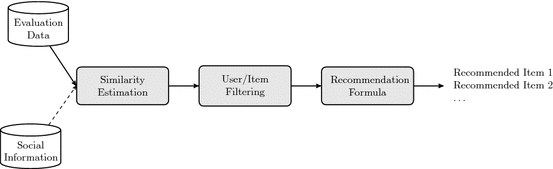

##### 2.2.1.1 User-user collaborative based filtering

In this model, products are recommended to a user based on the fact that the products have been liked by users similar to the user.

In [26]:
# Creating a small test dataframe to evaluate our models
tests = train.copy()
tests.drop(['timestamp'], axis=1, inplace=True)
tests = tests.head(10000)

# Creating the training data
reader = Reader(rating_scale=(0.5, 5))
test_data = Dataset.load_from_df(tests[['userId','movieId','rating']], reader)

# Compute similarities between users using cosine distance
sim_options = {"name": "cosine",
               "user_based": True}  

# Evaluate the model 
user = KNNWithMeans(sim_options=sim_options)
cv = cross_validate(user, test_data, cv=5, measures=['RMSE'], verbose=True)

Computing the cosine similarity matrix...
Done computing similarity matrix.
Computing the cosine similarity matrix...
Done computing similarity matrix.
Computing the cosine similarity matrix...
Done computing similarity matrix.
Computing the cosine similarity matrix...
Done computing similarity matrix.
Computing the cosine similarity matrix...
Done computing similarity matrix.
Evaluating RMSE of algorithm KNNWithMeans on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    1.1068  1.0878  1.1268  1.1386  1.0714  1.1063  0.0246  
Fit time          1.64    0.84    0.76    0.80    0.79    0.97    0.34    
Test time         0.70    0.08    0.01    0.02    0.03    0.17    0.27    


This based on a 1% sample of the train data and gives us a RMSE score of 1.1. We can only comment on the accuracy of the model once we have more models to compare RMSE score with.

#### 2.2.1.2 Item-Item collaborative based filtering

These systems identify similar items based on users’ previous ratings.

In [27]:
# Compute similarities between items using cosine distance
sim_options = {"name": "cosine",
               "user_based": False}  

# Fit the KNNwithmeans algorithm to the training set
item_based = KNNWithMeans(sim_options=sim_options)

# Evaluate the model 
cv = cross_validate(item_based, test_data, cv=5, measures=['RMSE'], verbose=True)

Computing the cosine similarity matrix...
Done computing similarity matrix.
Computing the cosine similarity matrix...
Done computing similarity matrix.
Computing the cosine similarity matrix...
Done computing similarity matrix.
Computing the cosine similarity matrix...
Done computing similarity matrix.
Computing the cosine similarity matrix...
Done computing similarity matrix.
Evaluating RMSE of algorithm KNNWithMeans on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    1.0755  1.0964  1.0898  1.1053  1.0826  1.0899  0.0104  
Fit time          0.29    0.17    0.17    0.17    0.16    0.19    0.05    
Test time         0.00    0.02    0.01    0.01    0.02    0.01    0.01    


The item-based is also based on a 1% sample of the train data and gives an RMSE score of 1.09 which is only a slight improvement on the user-based method.

### 2.2.2 Model-based

Model based approaches predict user ratings for movies that users are yet to see and then filter based on predicted rating. On a 100k subset of the data, we will train and evaluate the models' performance. The model with the greatest performance will be hyperparameterized and trained on the entire dataset for the submission file.

We looked at seven models from the surprise package in this report.

Below we are trying to store the train data in the format required by surprise, then create Dataset object by reading from dataframe.

In [28]:
# Load the 100k dataset
train.drop('timestamp', axis=1, inplace=True)
train_subset = train[:100000]
reader = Reader(rating_scale=(train_subset['rating'].min(), train_subset['rating'].max()))
data = Dataset.load_from_df(train_subset[['userId', 'movieId', 'rating']], reader)
trainset, testset = train_test_split(data, test_size=.25, random_state=42)

#### SVD (Singular Value Decomposition)

A factorization of a matrix into three matrices is called Singular Value Decomposition (SVD). It possesses some interesting algebraic characteristics and communicates important geometrical and theoretical insights into linear transformations.
 
The SVD-like model in Python's Surprise-package does not determine the SVD factors, but rather sets an optimisation problem for the matrix factors, this is done to account for sparsity of matrix also. It assumes that ratings matrix can be appriximated by product of 2 factors. These matrix factors are assumed to create latent features becuase they too, like in PCA, describe the features of matrix in a different feature space.

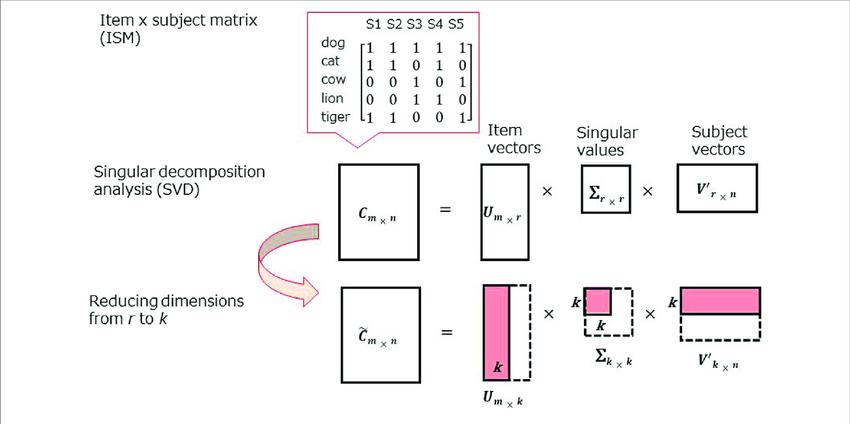
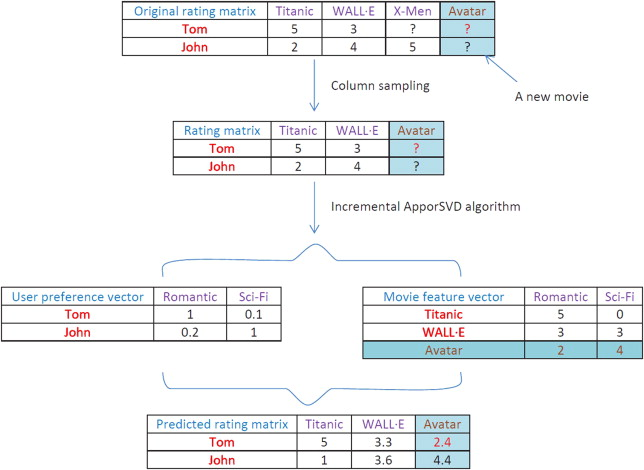

In [29]:
svd_sub = SVD()
svd_sub.fit(trainset)
svd_pred = svd_sub.test(testset)

# Model Preformance

svd_rmse = accuracy.rmse(svd_pred)

RMSE: 0.9823


#### SVD ++

This is an extension of SVD but takes into account implicite ratings (i.e. whether a user rated item of interest or not, regardless of rating).

In [30]:
svdpp_sub = SVDpp()
svdpp_sub.fit(trainset)
svdpp_pred = svdpp_sub.test(testset)

# Model Preformance

svdpp_rmse = accuracy.rmse(svdpp_pred)

RMSE: 0.9797


#### Normal Predictor (NP)

NormalPredictor algorithm predicts a random rating based on the distribution of the training set, which is assumed to be normal.  This is one of the simplest algorithms that doesn't require much effort.

In [31]:
np_sub = NormalPredictor()
np_sub.fit(trainset)
np_pred = np_sub.test(testset)

# Model Performance

np_rmse = accuracy.rmse(np_pred)

RMSE: 1.4515


#### Baseline Only (bsl)

For a given user and item, the BaselineOnly method forecasts the baseline estimate.
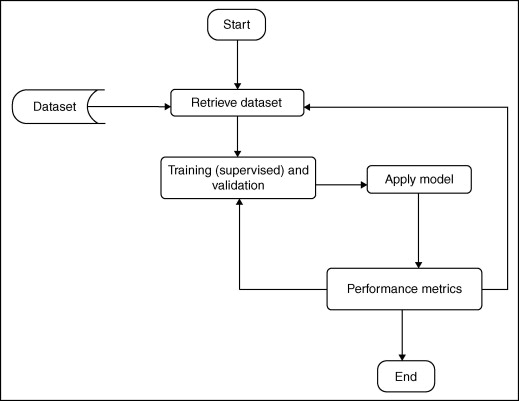

In [32]:
bsl_options = {'method':'sgd', 'n_epochs':40}

blo_sub = BaselineOnly(bsl_options=bsl_options)
blo_sub.fit(trainset)
blo_pred = blo_sub.test(testset)

# Model Performance

blo_rmse = accuracy.rmse(blo_pred)

Estimating biases using sgd...
RMSE: 0.9735


#### Non-negative matrix factorization (NMF)

NMF is a collaborative filtering algorithm based on Non-negative Matrix Factorization. It is very similar with SVD.It is an unsupervised algorithm that projects data into lower dimensional spaces, effectively reducing the number of features while retaining the basis information necessary to reconstruct the original data.

Matrix factorization is a collaborative based filtering method which is used in recommender systems. Like other methods in recommender systems, the typical input is user-item interaction that can be stored in a matrix with each row represents each user, and each column dedicates to each item. Since not every user is going rate each item, the user-item interaction matrix will be sparse. Therefore, the goal of matrix factorization method is to predict missing entries.

In order to predict missing entries, the main matrix is decomposed into the product of two lower dimensional matrices. The first matrix has the same number of rows as the main matrix and each row belongs to each person, while the second matrix has a column for each item. Each of the two matrices expresses the power of association between a user or an item with latent factors or hidden features.

Number of latent factors can be vary. As the number of chosen latent factors increases, more hidden factors have been extracted from the data and therefore the quality of recommendation system improves. However, at some points too much increase of the number of latent factors causes over-fitting over the data and thereby reducing recommendation quality.

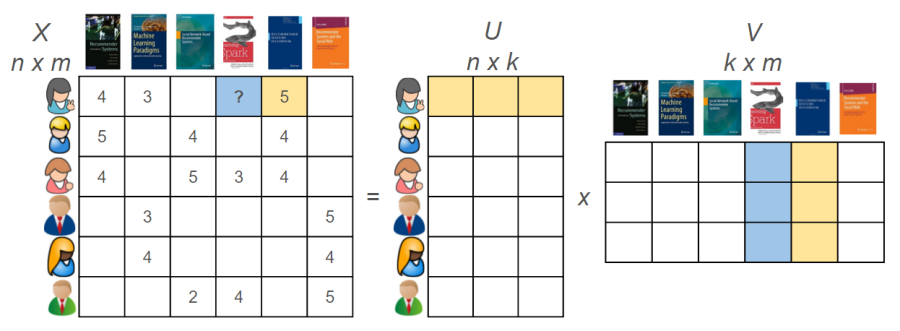

In [33]:
nmf_sub = NMF()
nmf_sub.fit(trainset)
nmf_pred = nmf_sub.test(testset)

# Model Performance

nmf_rmse = accuracy.rmse(nmf_pred)

RMSE: 1.1611


#### Slope One

Slope One algorithm uses simple linear regression model to solve data sparisity problem.

The method calculates the similarity between users based on users' ratings, so as to find every user's nearest neighbors. Based on the nearest neighbor's ratings, weighted Slope one algorithm is used to predict the unknown ratings of the target user and to present recommendation results.

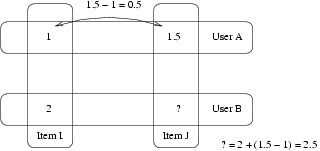

In [34]:
so_sub = SlopeOne()
so_sub.fit(trainset)
so_pred = so_sub.test(testset)

# Model Performance

so_rmse = accuracy.rmse(so_pred)

RMSE: 1.1598


#### Co Clustering

Co-clustering (or Biclustering) is a term in data mining that relates to a simultaneous clustering of the rows and columns of a matrix. Where classical clustering methods assume that a membership of an object (in a group of objects) depends solely on its similarity to other objects of the same type (same entity type), co-clustering can be seen as a method of co-grouping two types of entities simultaneously, based on similarity of their pairwise interactions.

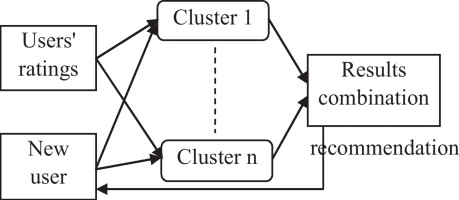

In [35]:
cc_sub = CoClustering(random_state=42)
cc_sub.fit(trainset)
cc_pred = cc_sub.test(testset)

# Model Performance

cc_rmse = accuracy.rmse(cc_pred)

RMSE: 1.1514


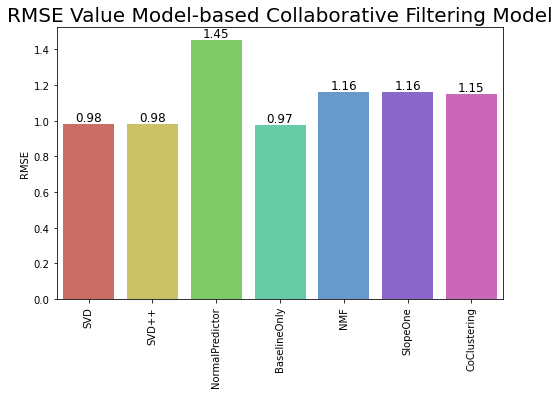

In [36]:
# Compare RMSE values between models
fig,axis = plt.subplots(figsize=(8, 5))
rmse_x = ['SVD','SVD++','NormalPredictor','BaselineOnly','NMF','SlopeOne','CoClustering']
rmse_y = [svd_rmse,svdpp_rmse,np_rmse,blo_rmse,nmf_rmse,so_rmse,cc_rmse]
ax = sns.barplot(x=rmse_x, y=rmse_y,palette='hls')
plt.title('RMSE Value Model-based Collaborative Filtering Model',fontsize=20)
plt.xticks(rotation=90)
plt.ylabel('RMSE')
for p in ax.patches:
    ax.text(p.get_x() + p.get_width()/2, p.get_y() + p.get_height(), round(p.get_height(),2), fontsize=12, ha="center", va='bottom')
    
plt.show()

In [ ]:
benchmark = []
# Iterate over all algorithms

algorithms = [SVD(), SVDpp(), SlopeOne(), NMF(), NormalPredictor(),
              KNNBaseline(), KNNBasic(), KNNWithMeans(),
              KNNWithZScore(), BaselineOnly(), CoClustering()]

print ("Attempting: ", str(algorithms), '\n\n\n')

for algorithm in algorithms:
    print("Starting: " ,str(algorithm))
    # Perform cross validation
    results = cross_validate(algorithm, data, measures=['RMSE'],
                             cv=3, verbose=False)
    # results = cross_validate(algorithm, data, measures=['RMSE','MAE'], cv=3, verbose=False)
    
    # Get results & append algorithm name
    tmp = pd.DataFrame.from_dict(results).mean(axis=0)
    tmp = tmp.append(pd.Series([str(algorithm).split(' ')[0].split('.')[-1]],
                               index=['Algorithm']))
    benchmark.append(tmp)
    print("Done: " ,str(algorithm), "\n\n")

print ('\n\tDONE\n')

In [ ]:
surprise_results = pd.DataFrame(benchmark).set_index('Algorithm').sort_values('test_rmse')

In [ ]:
surprise_results

In [37]:
svd = SVD()
# Run 5-fold cross-validation and print results
svd_cv = cross_validate(svd, data, measures=['RMSE'], cv=5, verbose=True)

Evaluating RMSE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.9774  0.9754  0.9814  0.9736  0.9809  0.9777  0.0031  
Fit time          3.33    3.51    3.51    3.52    3.40    3.45    0.08    
Test time         0.09    0.11    0.19    0.08    0.09    0.11    0.04    


In [38]:
svdpp = SVDpp()
# Run 5-fold cross-validation and print results
svdpp_cv = cross_validate(svdpp, data, measures=['RMSE'], cv=5, verbose=True)

Evaluating RMSE of algorithm SVDpp on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.9771  0.9741  0.9736  0.9781  0.9689  0.9744  0.0032  
Fit time          7.01    6.70    7.11    6.98    7.02    6.96    0.14    
Test time         0.17    0.19    0.16    0.20    0.17    0.18    0.02    


In [39]:
bsl_options = {'method':'sgd', 'n_epochs':40}
blo = BaselineOnly(bsl_options=bsl_options)

# Run 5-fold cross-validation and print results
blo_cv = cross_validate(blo, data, measures=['RMSE'], cv=5, verbose=True)


Estimating biases using sgd...
Estimating biases using sgd...
Estimating biases using sgd...
Estimating biases using sgd...
Estimating biases using sgd...
Evaluating RMSE of algorithm BaselineOnly on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.9682  0.9668  0.9680  0.9640  0.9727  0.9680  0.0028  
Fit time          0.80    0.81    0.83    0.85    0.83    0.82    0.02    
Test time         0.06    0.06    0.06    0.08    0.06    0.07    0.01    


In [71]:
#  DO NOT run this cell. It will run for 2-3 hours

param_grid = {'n_epochs':[30,40,50], 
              'n_factors':[200,300,400], 
              'init_std_dev':[0.001, 0.005, 0.05, 0.1], 
              'random_state':[42]} 
grid_SVD = GridSearchCV(SVD, cv=5, measures=['rmse'], param_grid=param_grid, n_jobs=-1, joblib_verbose=10)
grid_SVD.fit(data)
print('Best Score is: ')
print(grid_SVD.best_score['rmse'])
print('Best Parameters are: ')
print(grid_SVD.best_params['rmse'])
# n_epochs = 40, n_factors = 400, init_std_dev = 0.005, random_state=42

In [40]:
svd_test = SVD(n_epochs = 40, n_factors = 400, init_std_dev = 0.005, random_state=42)
svd_test.fit(trainset)
predictions = svd_test.test(testset)
# Calculate RMSE
svd_rmse = accuracy.rmse(predictions)

RMSE: 0.9734


In [68]:
# Train model on whole dataset
reader = Reader(rating_scale=(train_df['rating'].min(), train_df['rating'].max()))
data = Dataset.load_from_df(train_df[['userId', 'movieId', 'rating']], reader)
trainset = data.build_full_trainset()
svd = SVD(n_epochs = 40, n_factors = 400, init_std_dev = 0.005, random_state=42, verbose=True)
svd.fit(trainset)

# Create Kaggle submission file
predictions = []
for i, row in test_df.iterrows():
    x = (svd.predict(row.userId, row.movieId))
    pred = x[3]
    predictions.append(pred)
test_df['Id'] = test_df['userId'].map(str) +'_'+ test_df['movieId'].map(str)
results = pd.DataFrame({"Id":test_df['Id'],"rating": predictions})
results.to_csv("submission1.csv", index=False)

Processing epoch 0
Processing epoch 1
Processing epoch 2
Processing epoch 3
Processing epoch 4
Processing epoch 5
Processing epoch 6
Processing epoch 7
Processing epoch 8
Processing epoch 9
Processing epoch 10
Processing epoch 11
Processing epoch 12
Processing epoch 13
Processing epoch 14
Processing epoch 15
Processing epoch 16
Processing epoch 17
Processing epoch 18
Processing epoch 19
Processing epoch 20
Processing epoch 21
Processing epoch 22
Processing epoch 23
Processing epoch 24
Processing epoch 25
Processing epoch 26
Processing epoch 27
Processing epoch 28
Processing epoch 29
Processing epoch 30
Processing epoch 31
Processing epoch 32
Processing epoch 33
Processing epoch 34
Processing epoch 35
Processing epoch 36
Processing epoch 37
Processing epoch 38
Processing epoch 39


In [70]:
predictions = []
for i, row in test_df.iterrows():
    x = (svd.predict(row.userId, row.movieId))
    pred = x[3]
    predictions.append(pred)
test_df['Id'] = test_df['userId'].map(str) +'_'+ test_df['movieId'].map(str)
results = pd.DataFrame({"Id":test_df['Id'],"rating": predictions})
results.to_csv("submission1.csv", index=False)

In [41]:

# Train model on whole dataset
reader = Reader(rating_scale=(train_df['rating'].min(), train_df['rating'].max()))
data = Dataset.load_from_df(train_df[['userId', 'movieId', 'rating']], reader)
trainset = data.build_full_trainset()
blo_sub = BaselineOnly(bsl_options=bsl_options)
blo_sub.fit(trainset)

# Create Kaggle submission file
predictions = []
for i, row in test_df.iterrows():
    x = (blo_sub.predict(row.userId, row.movieId))
    pred = x[3]
    predictions.append(pred)
test_df['Id'] = test_df['userId'].map(str) +'_'+ test_df['movieId'].map(str)
results = pd.DataFrame({"Id":test_df['Id'],"rating": predictions})
results.to_csv("blo.csv", index=False)

Estimating biases using sgd...


# References

https://www.geeksforgeeks.org/singular-value-decomposition-svd/
https://www.youtube.com/watch?v=P5mlg91as1c&ab_channel=ArtificialIntelligence-AllinOne
https://towardsdatascience.com/building-and-testing-recommender-systems-with-surprise-step-by-step-d4ba702ef80b#:~:text=SVDpp,takes%20into%20account%20implicit%20ratings.
https://www.sciencedirect.com/topics/computer-science/baseline-model
https://medium.com/mlearning-ai/building-movie-recommendation-system-with-surprise-and-python-e905de755c61
https://medium.com/@farnazgh73/non-negative-matrix-factorization-nmf-4798d29e8c62#:~:text=Non%2DNegative%20Matrix%20Factorization%20(NMF)%20for%20Recommender%20Systems,-Farnaz%20Ghasemi%20Toudeshki&text=Matrix%20factorization%20is%20a%20collaborative,is%20used%20in%20recommender%20systems.&text=The%20first%20matrix%20has%20the,a%20column%20for%20each%20item.
https://www.sciencedirect.com/science/article/pii/S1877050920301642
https://link.springer.com/chapter/10.1007/978-3-642-28635-3_15
https://ieeexplore.ieee.org/abstract/document/7531393
https://datasciencemadesimpler.wordpress.com/tag/co-clustering/